In [78]:
from scipy.misc import imread
from sklearn.externals import joblib

import random as rand
import numpy as np 
import cv2
import glob
import time
import numpy as np
import pickle
import os

import matplotlib.pyplot as plt
%matplotlib inline

from helpers import convert, show_images, put_boxes
from featuresourcer import FeatureSourcer
from binaryclassifier import BinaryClassifier
from slider import Slider
import time
from sklearn.metrics import roc_curve, auc

In [8]:
svc = joblib.load('svc_rbf_ts7.pkl')
scaler = joblib.load('scaler2_ts7.pkl')

sourcer_params = {
  'color_model': 'yuv',                # hls, hsv, yuv, ycrcb
  'bounding_box_size': 64,             #
  'number_of_orientations': 6,        # 6 - 12
  'pixels_per_cell': 16,               # 8, 16
  'cells_per_block': 2,                # 1, 2
  'do_transform_sqrt': True
}

cls = BinaryClassifier(svc, scaler)
start_frame = imread("C:\\Users\\Deepak Reddy\\Desktop\\old desk\\Old_desk_04Feb18\\Python\\Trafficsign_Datasets\\
GTSDB\\FullIJCNN2013\\25\\00030.ppm")
src = FeatureSourcer(sourcer_params, start_frame) 
slider = Slider(sourcer = src, classifier = cls, increment = 16)

c:\users\deepak reddy\appdata\local\conda\conda\envs\tensorflow\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


In [9]:
def bounding_boxes_test(this_frame, ws, wp):
    
  boxed_images = []
  strips = []
  bounding_boxes_total = [] 
  y_scores_total = []
  for ws, wp in zip(ws, wp):
    bounding_boxes, y_scores = slider.locate(frame = this_frame, window_size = ws, window_position = wp)

    bounding_boxes_total.append((bounding_boxes))
    y_scores_total.append((y_scores))
  return bounding_boxes_total, y_scores_total
  

In [10]:
def y_testimg(this_frame, ws, wp, area):
  y_test_tot, per_tot = [], []
  for ws, wp in zip(ws, wp):
    y_test, per = slider.locate_test(frame = this_frame, window_size = ws, window_position = wp, area = area)
    y_test_tot.append(y_test)
    per_tot.append(per)
  return y_test_tot, per_tot

In [11]:
def detected_boxes(img):
    
    window_size = [32, 48, 64, 96, 128]
    boxes_ws, boxes_tot = [], []
    y_scores_tot, y_scores_list = [], []

    time_tot =0
    for ws in window_size:
        incr_pix = ws//4
        wp_tot = (img.shape[0]-ws)//incr_pix + 1

        wp = incr_pix * np.arange(0,wp_tot)
        ws = ws * np.ones(wp_tot, dtype = int)

        start = time.clock()
        boxes, y_scores = bounding_boxes_test(img, ws, wp)
        #print (boxes)
        end = time.clock()
        boxes_ws.append(boxes)
        y_scores_tot.append(y_scores)
        #print ("time for %d: %f" %(ws[0], end-start))
        time_tot = time_tot + (end-start)
        
    for boxes in boxes_ws:
        for bounding_boxes in boxes:
            for box in bounding_boxes:
                if len(box) > 0:
                    boxes_tot.append(box)
    
    for i in range(len(y_scores_tot)):
        for j in range(len(y_scores_tot[i])):
            for k in range(len(y_scores_tot[i][j])):
                y_scores_list.append(y_scores_tot[i][j][k])
    print ("time for img: %f" %(time_tot/60))
    return boxes_tot, y_scores_list

In [27]:
def y_testimg_tot(img, area):
    
    window_size = [32, 48, 64, 96, 128]
    y_test_ws, per_ws = [], []
    y_test_tot, per_tot = [], []
    time_tot =0
    for ws in window_size:
        incr_pix = ws//4
        wp_tot = (img.shape[0]-ws)//incr_pix + 1

        wp = incr_pix * np.arange(0,wp_tot)
        ws = ws * np.ones(wp_tot, dtype = int)

        start = time.clock()
        y_test, per = y_testimg(img, ws, wp, area)
  
        end = time.clock()
        y_test_ws.append(y_test)
        per_ws.append(per)
        time_tot = time_tot + (end-start)
        
    #print ("time for img: %f" %(time_tot/60))
    for i in range(len(y_test_ws)):
        for j in range(len(y_test_ws[i])):
            for k in range(len(y_test_ws[i][j])):
                 y_test_tot.append(y_test_ws[i][j][k])
                 per_tot.append(per_ws[i][j][k])   
    return y_test_tot, per_tot

In [13]:
def draw_det_boxes(boxes_tot, img):

    if len(boxes_tot) > 0:
        img = put_boxes(img, boxes_tot)
        plt.figure(figsize=(20,10))
        plt.imshow(img)
        plt.show()
    else:
        print("No Traffic signs detected in image")

    print(boxes_tot)
    print("Total detected: %d" % (len(boxes_tot)))

In [14]:
frame1 = imread("C:\\Users\\Deepak Reddy\\Desktop\\old desk\\Old_desk_04Feb18\\Python\\Trafficsign_Datasets\\GTSDB\\FullIJCNN2013\\Testimg_Bin\\601.jpg")
frame2 = imread("00601.ppm")
frame3 = imread("00602.ppm")
frame4 = imread("00603.ppm")
frame5 = imread("C:\\Users\\Deepak Reddy\\Desktop\\old desk\\Old_desk_04Feb18\\Python\\Trafficsign_Datasets\\
GTSDB\\FullIJCNN2013\\test\\00618.ppm")
frame6 = imread("C:\\Users\\Deepak Reddy\\Desktop\\old desk\\Old_desk_04Feb18\\Python\\Trafficsign_Datasets\\
GTSDB\\FullIJCNN2013\\test\\00619.ppm")

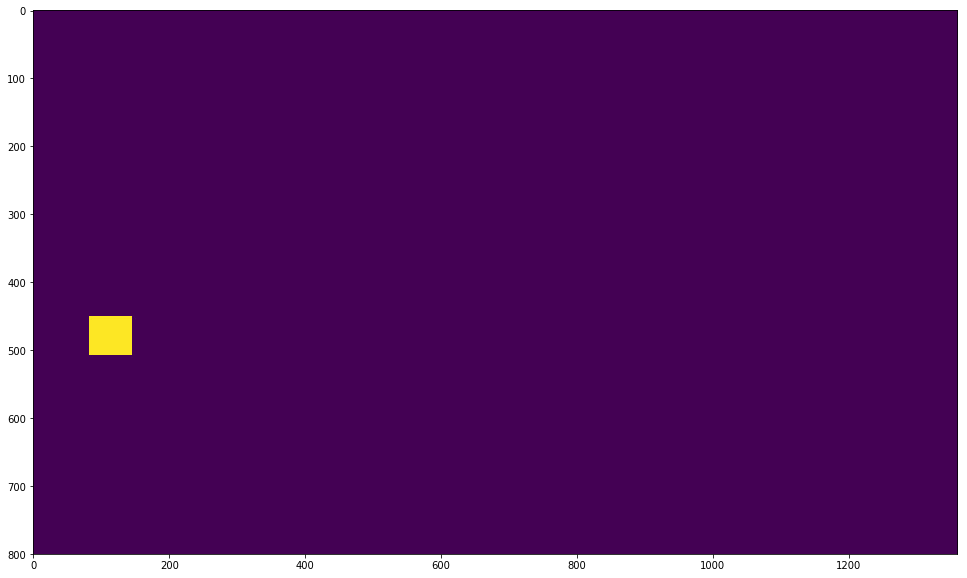

In [15]:
plt.figure(figsize=(20,10))
plt.imshow(frame1)

plt.show()

In [48]:
test_paths = glob.glob('C:\\Users\\Deepak Reddy\\Desktop\\old desk\\Old_desk_04Feb18\\Python\\Trafficsign_Datasets\\
GTSDB\\FullIJCNN2013\\test\\*.ppm') 

with open('C:\\Users\\Deepak Reddy\\Desktop\\old desk\\Old_desk_04Feb18\\Python\\Trafficsign_Datasets\\
GTSDB\\FullIJCNN2013\\gt.txt') as f:
    content = f.read().splitlines()
filename = 'save2.p'
y_test_prev = []
img_prev_no = 599
y_NTS = np.zeros(28824)

start = time.clock()
for i in range(852,951):
    img_content = content[i].split(';');
    img_sel_no = int(img_content[0].split('.')[0])
    path_img = "C:\\Users\\Deepak Reddy\\Desktop\\old desk\\Old_desk_04Feb18\\Python\\Trafficsign_Datasets\\GTSDB\\FullIJCNN2013\\Testimg_Bin\\" +str(img_sel_no)+ ".jpg"
    img_shape = imread(path_img).shape
    frame = np.zeros((img_shape[0], img_shape[1]))
    frame[int(img_content[2]):int(img_content[4]), int(img_content[1]):int(img_content[3])] = 255
    area = (int(img_content[4]) -int(img_content[2])) * (int(img_content[3]) -int(img_content[1]))
    
    y_test, per = y_testimg_tot(frame, area)
    y_test = np.asarray(y_test)
    per = np.asarray(per)
    
    # To add y_test, if not in gt.txt file
    diff = img_sel_no - img_prev_no
    if (diff > 1):
         for k in range(diff-1):
            save_scores(filename, y_NTS)
            
    #If same img repeats in gt.txt file
    if img_sel_no == img_prev_no:
        y_test_prev[np.where(y_test == 1)] = 1
        y_test = y_test_prev
        if os.path.exists(filename):
            with open(filename,'rb') as rfp:
                y_test_file = pickle.load(rfp)
                y_test_file.pop()
                with open(filename,'wb') as wfp:
                     pickle.dump(y_test_file, wfp)
    if (i%50 == 0):
        print("time : %f, i = %d, img_no = %d" %((time.clock() -start)/60, i, img_sel_no))
        
    save_scores(filename, y_test)
    img_prev_no = img_sel_no
    y_test_prev = y_test
   
#print(per[np.where(y_test == 1)])
#np.where(y_test == 1)                                                        
    

time : 1.831632, i = 900, img_no = 640
time : 3.751684, i = 950, img_no = 680


In [46]:
img_sel_no

615

In [13]:
y_test = y_testimg_tot(frame1, area)
y_test = np.asarray(y_test)
np.where(y_test == 1)

time for img: 0.027344


(array([24877, 24956, 24958, 25037, 27358, 27359, 27360, 27412, 27462,
        27463, 28464, 28467, 28500, 28503, 28536, 28539], dtype=int64),)

In [33]:
draw_det_boxes(boxes_ws, frame1)

No Traffic signs detected in image
[]
Total detected: 0


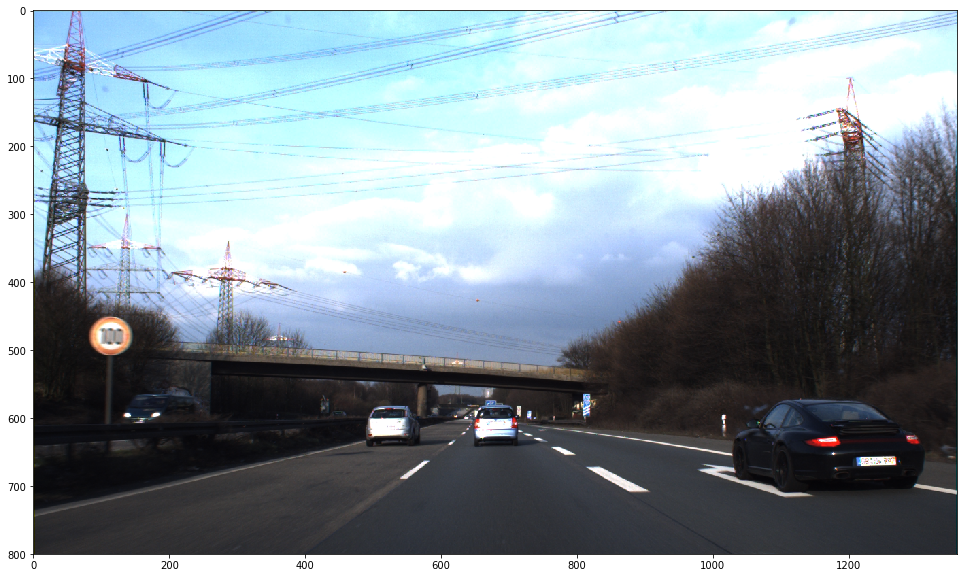

In [18]:
plt.figure(figsize=(20,10))
plt.imshow(frame2)
plt.show()

In [17]:
boxes_ws, y_scores = detected_boxes(frame2)

c:\users\deepak reddy\appdata\local\conda\conda\envs\tensorflow\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


time for img: 4.269223


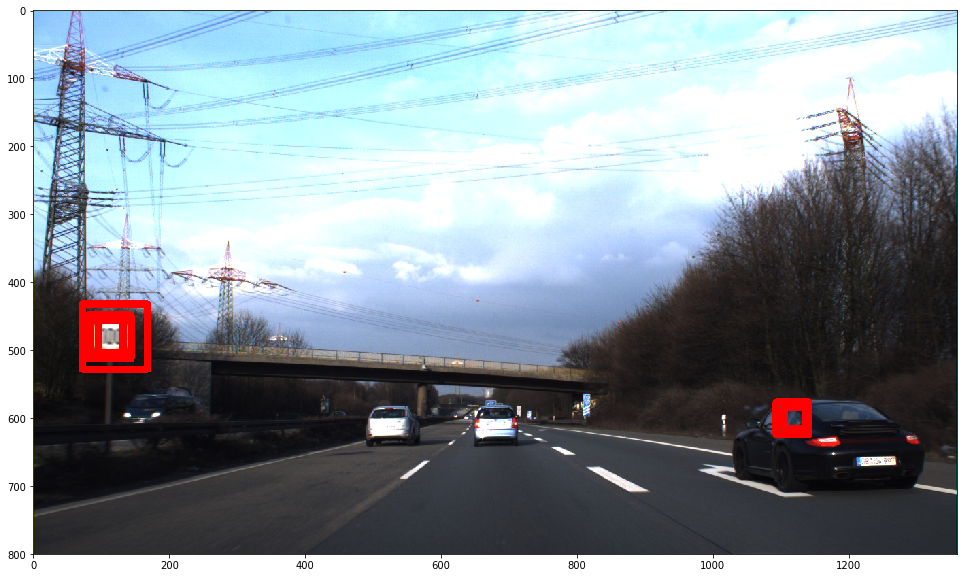

[(1104, 584, 32), (84, 456, 48), (96, 456, 48), (1092, 576, 48), (80, 448, 64), (72, 432, 96)]
Total detected: 6


In [8]:
draw_det_boxes(boxes_ws, frame2)

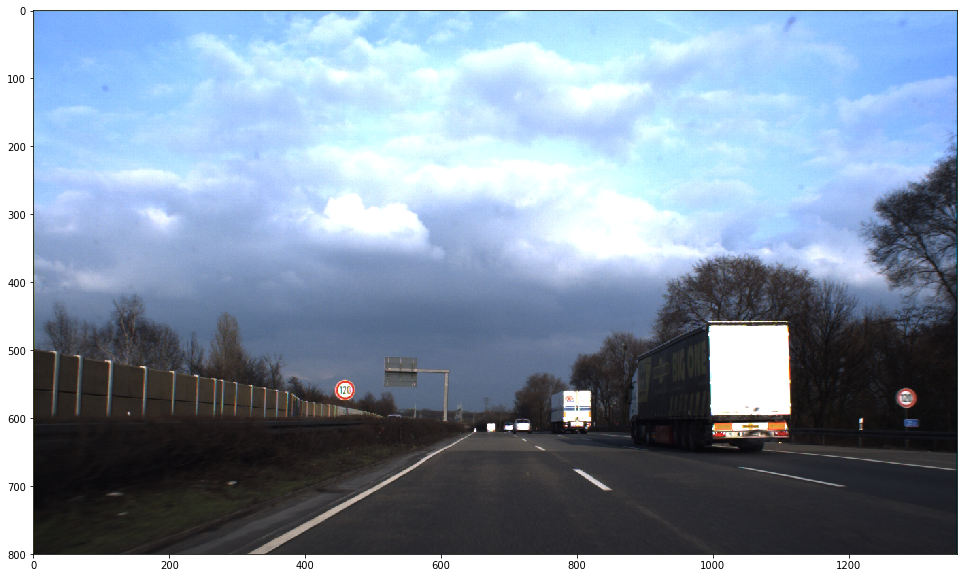

In [30]:
plt.figure(figsize=(20,10))
plt.imshow(frame3)
plt.show()

In [41]:
boxes_ws, y_scores = detected_boxes(frame3)

c:\users\deepak reddy\appdata\local\conda\conda\envs\tensorflow\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


time for img: 3.445837


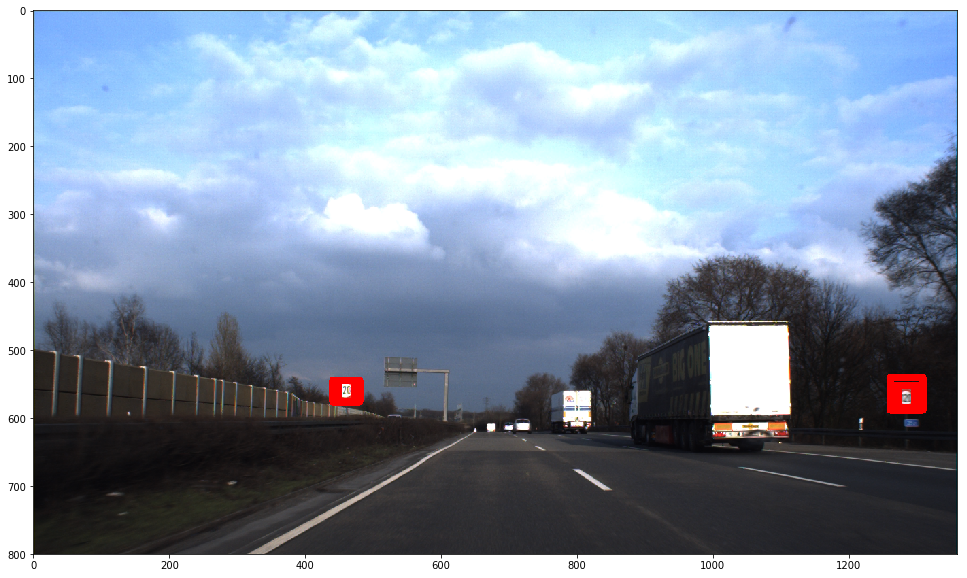

[(440, 544, 32), (448, 544, 32), (1264, 552, 32), (1272, 552, 32), (1260, 540, 48)]
Total detected: 5


In [15]:
draw_det_boxes(boxes_ws, frame3)

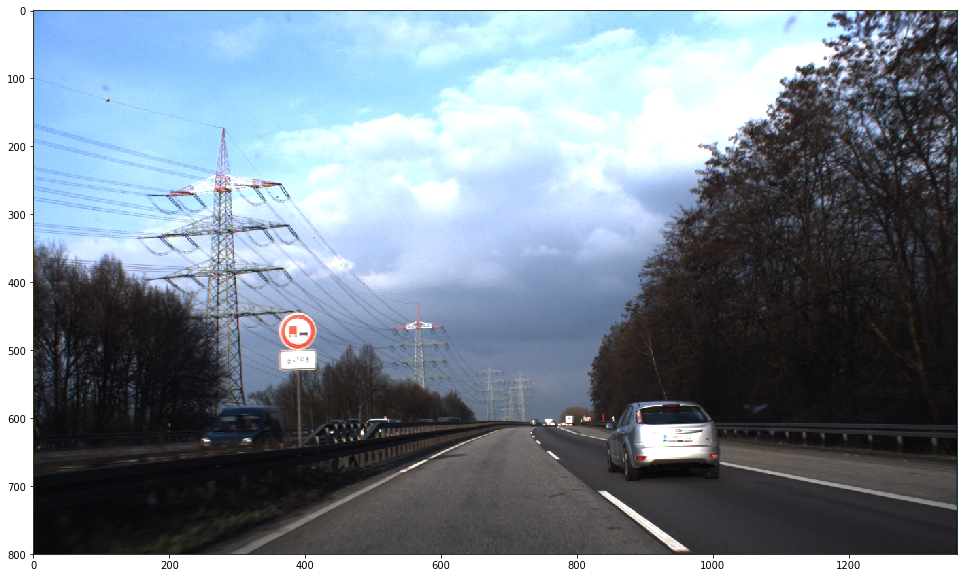

In [34]:
plt.figure(figsize=(20,10))
plt.imshow(frame4)
plt.show()

In [36]:
boxes_ws = detected_boxes(frame4)

c:\users\deepak reddy\appdata\local\conda\conda\envs\tensorflow\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


time for 32: 93.903421
time for 48: 37.216599
time for 64: 23.743862
time for 96: 8.998165
time for 128: 4.822247


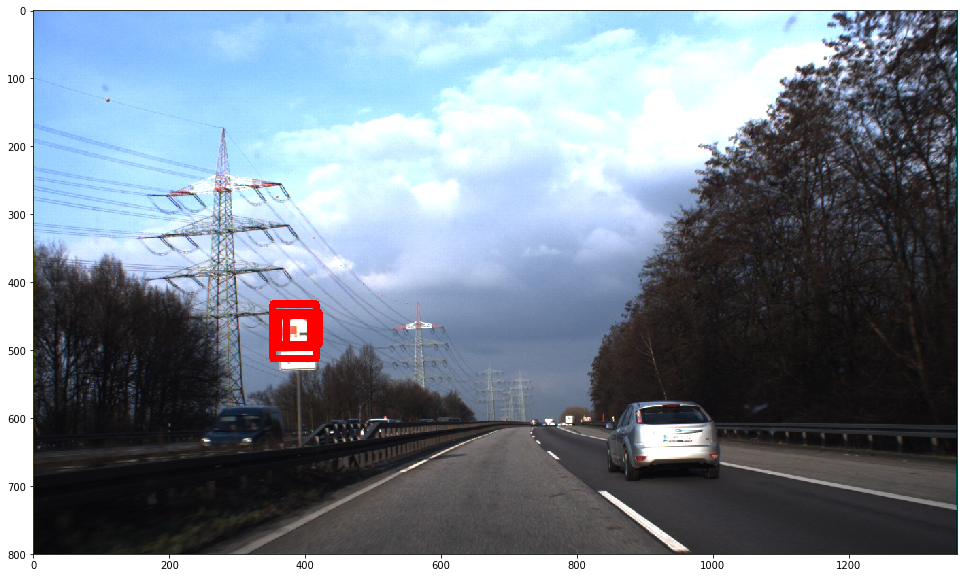

[(360, 444, 48), (372, 444, 48), (352, 432, 64), (352, 448, 64)]
Total detected: 4


In [37]:
draw_det_boxes(boxes_ws, frame4)

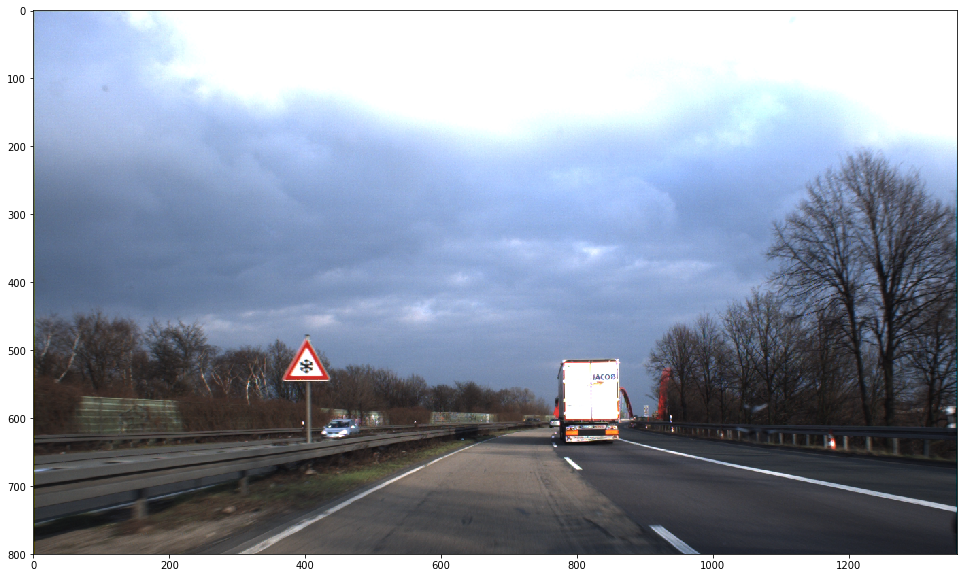

In [38]:
plt.figure(figsize=(20,10))
plt.imshow(frame5)
plt.show()

In [10]:
boxes_ws, y_scores = detected_boxes(frame5)

c:\users\deepak reddy\appdata\local\conda\conda\envs\tensorflow\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


time for 32: 108.132260
time for 48: 44.289763
time for 64: 24.482973
time for 96: 10.258127
time for 128: 5.480944


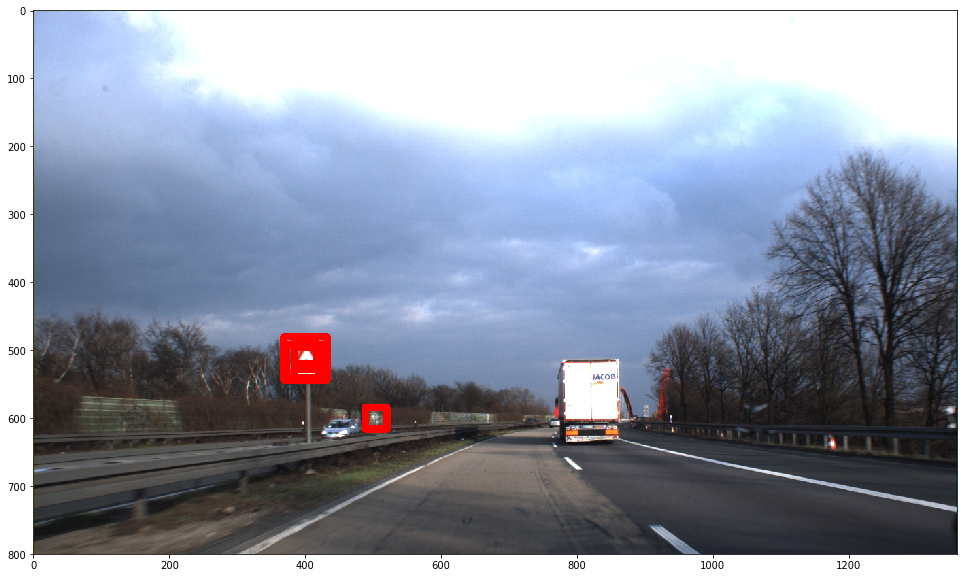

[(384, 488, 32), (384, 496, 32), (488, 584, 32), (372, 492, 48), (384, 492, 48), (368, 480, 64)]
Total detected: 6


In [11]:
draw_det_boxes(boxes_ws, frame5)

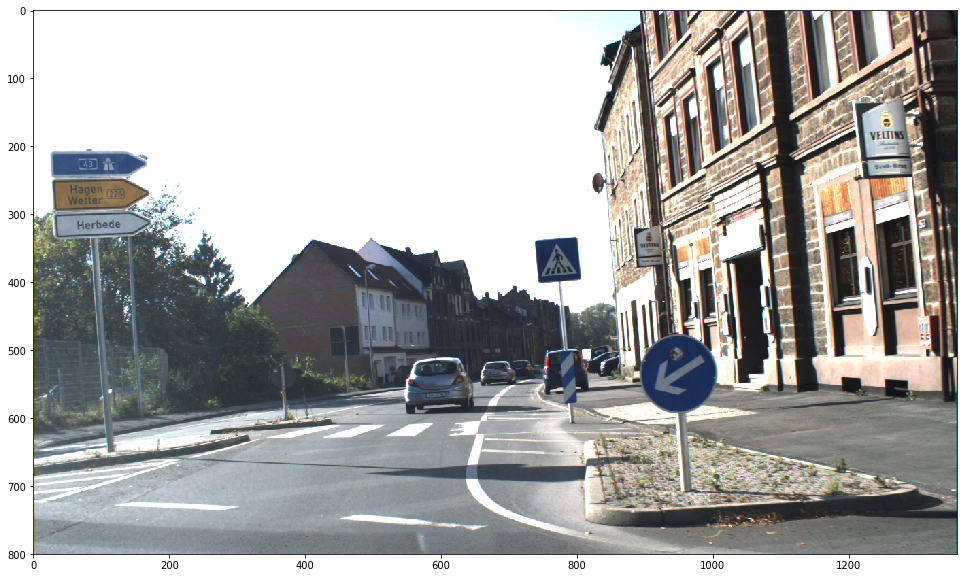

(800, 1360, 3)

In [15]:
plt.figure(figsize=(20,10))
plt.imshow(frame6)
plt.show()
frame6.shape

In [13]:
boxes_ws, y_scores = detected_boxes(frame6)

c:\users\deepak reddy\appdata\local\conda\conda\envs\tensorflow\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


time for img: 3.065120


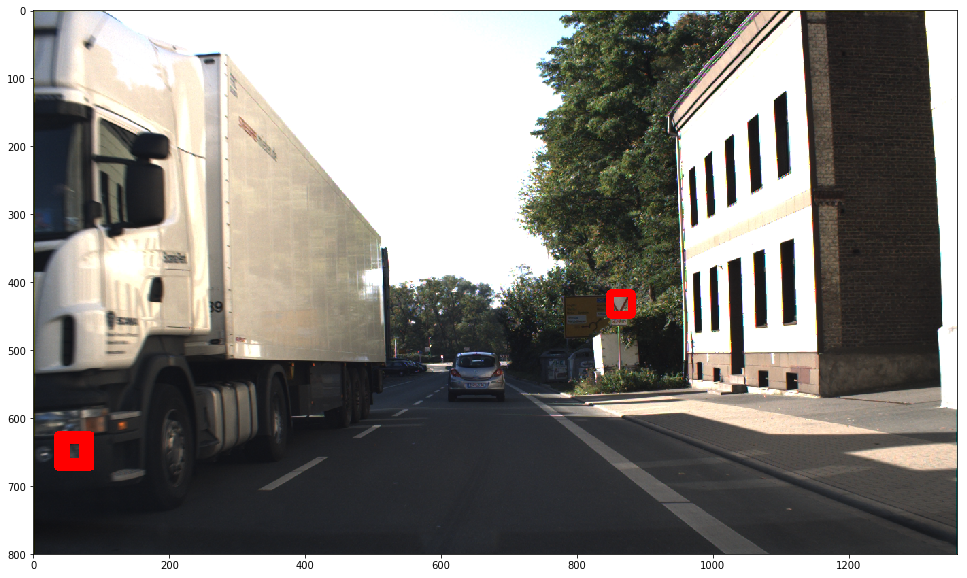

[(848, 416, 32), (40, 632, 32), (48, 632, 32), (36, 624, 48)]
Total detected: 4


In [14]:
draw_det_boxes(boxes_ws, frame6)

In [5]:
wp = 464, 478
ws = 140, 128

boxes = bounding_boxes_test(frame6, ws, wp)
print (boxes)

c:\users\deepak reddy\appdata\local\conda\conda\envs\tensorflow\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


[[], []]


In [8]:
def color_features(frame):
    U = []
    V = []
    frame1 = frame[:,:,1]
    frame2 = frame[:,:,2]
    ppc = 8
    x = (frame1.shape[1]//(2*ppc)) * 2*ppc;
    y = (frame1.shape[0]//ppc) * ppc;
    for j in range(0, x, 2*ppc):
        for i in range(0, y, ppc):
            U.append(np.mean(frame1[i:i+ppc, j:j+2*ppc]))
            V.append(np.mean(frame2[i:i+ppc, j:j+2*ppc]))
    return np.hstack((U, V))

In [9]:
frame = imread("C:\\Users\\Deepak Reddy\\Desktop\\old desk\\Old_desk_04Feb18\\Python\\Trafficsign_Datasets\\
GTSDB\\FullIJCNN2013\\25\\00030.ppm")
frame = cv2.resize(frame, (64, 64))
print(frame.shape)
f_col = color_features(frame)
f_col.shape

(64, 64, 3)


(64,)

In [19]:
def save_scores(filename, y_scores):
  
    scores_list =[]
   
    if os.path.exists(filename):
        # "with" statements are very handy for opening files.
        with open(filename,'rb') as rfp:
            scores = pickle.load(rfp)
            scores_list = scores

    scores_list.append(y_scores)    
    with open(filename,'wb') as wfp:
        pickle.dump(scores_list, wfp)
    

In [67]:
def save_op(file_scores, boxes_ws, y_scores):
    save_scores(file_scores, y_scores)
    
    with open('test_detected1.txt', 'a') as file_handler:
         file_handler.write("{}\n".format(boxes_ws))   


In [70]:
Testimgs_paths = glob.glob('C:\\Users\\Deepak Reddy\\Desktop\\old desk\\Old_desk_04Feb18\\Python\\Trafficsign_Datasets\\
GTSDB\\FullIJCNN2013\\test\\*.ppm') 
for n in range(0,30):
    img = imread(Testimgs_paths[n])
    boxes_ws, y_scores = detected_boxes(img)
    save_op('save12.p', boxes_ws, y_scores)

c:\users\deepak reddy\appdata\local\conda\conda\envs\tensorflow\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


time for img: 3.141905
time for img: 3.153241
time for img: 3.162793
time for img: 3.374291
time for img: 3.339866
time for img: 3.378761
time for img: 3.334173
time for img: 3.336080
time for img: 3.346879
time for img: 3.330563
time for img: 3.326962
time for img: 3.330538
time for img: 3.350793
time for img: 3.344883
time for img: 3.313549
time for img: 3.344309
time for img: 3.345346
time for img: 3.327701
time for img: 3.335341
time for img: 3.020820
time for img: 2.805054
time for img: 2.778308
time for img: 2.763936
time for img: 2.753008
time for img: 2.774949
time for img: 2.749557
time for img: 2.758390
time for img: 2.767703
time for img: 2.761717
time for img: 2.771224


In [38]:
with open('test_detected.txt', 'a') as file_handler:
     file_handler.write("{}\n".format(boxes_ws))  

In [83]:
with open('save12.p','rb') as rfp:
    scores1 = np.asarray(pickle.load(rfp)).flatten()
len(scores1)

864720

In [84]:
with open('save2.p','rb') as rfp:
    y_test_tot = np.asarray(pickle.load(rfp)[0:30]).flatten()
len(y_test_tot)

864720

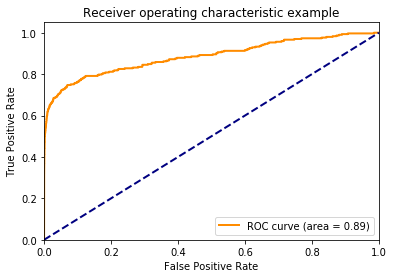

In [86]:
fpr, tpr, _ = roc_curve(y_test_tot, scores1)
roc_auc = auc(fpr, tpr)

plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

In [6]:
fruits = ['apple', 'banana', 'cherry']
fruits.pop(1)
print(fruits)

['apple', 'cherry']
